In [1]:
#importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
#reading the data
train = pd.read_csv("train.csv")
train.head(2)

,patient_id,patient_race,payer_type,patient_state,patient_zip3,Region,Division,patient_age,patient_gender,bmi,...,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18,metastatic_diagnosis_period
0,268700,NaN,COMMERCIAL,AR,724,South,West South Central,39,F,NaN,...,52.55,74.77,79.96,81.69,78.30,74.56,59.98,42.98,41.18,191
1,484983,White,NaN,IL,629,Midwest,East North Central,55,F,35.36,...,49.30,72.87,77.40,77.43,75.83,72.64,58.36,39.68,39.71,33


In [3]:
test = pd.read_csv("test.csv")
test.head(2)

,patient_id,patient_race,payer_type,patient_state,patient_zip3,Region,Division,patient_age,patient_gender,bmi,...,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18
0,730681,NaN,COMMERCIAL,LA,713,South,West South Central,55,F,NaN,...,62.21,62.23,78.34,81.96,83.58,82.22,80.20,69.73,53.14,51.34
1,334212,Black,NaN,NC,283,South,South Atlantic,60,F,40.0,...,48.63,58.14,77.26,80.05,82.88,82.09,78.85,64.60,50.57,48.10


In [4]:
#chceking the infomation of the train data
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13173 entries, 0 to 13172
Columns: 152 entries, patient_id to metastatic_diagnosis_period
dtypes: float64(137), int64(4), object(11)
memory usage: 15.3+ MB


In [5]:
#checkng for test set
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5646 entries, 0 to 5645
Columns: 151 entries, patient_id to Average of Dec-18
dtypes: float64(137), int64(3), object(11)
memory usage: 6.5+ MB


In [6]:
# print out the size of the data set
print ("Numbers of rows and columns in training set: ", train.shape)
print ("Number of rows and columns in testing set:", test.shape)

Numbers of rows and columns in training set:  (13173, 152)
Number of rows and columns in testing set: (5646, 151)


In [7]:
# separate into categorical and numeric data type
# Categorical columns
num_col = train.select_dtypes(include=['number']).columns
#numerical columns
cat_col = train.select_dtypes(exclude=['number']).columns

In [8]:
# Check for missing values in the entire dataset
missing_values_total = train.isnull().sum()

# Check for missing values as a percentage of total values
missing_values_percentage = (train.isnull().sum() / len(train)) * 100

# Create DataFrames for numerical and categorical missing values
numerical_missing_values = missing_values_total[num_col]
categorical_missing_values = missing_values_total[cat_col]

# Create DataFrames for numerical and categorical missing percentages
numerical_missing_percentage = missing_values_percentage[num_col]
categorical_missing_percentage = missing_values_percentage[cat_col]

# Display the numerical missing values summary
print("Numerical Missing Values:")
numerical_summary = pd.DataFrame({
    'Total Missing Values': numerical_missing_values,
    'Percentage of Missing Values': numerical_missing_percentage
})
display(numerical_summary)

# Display the categorical missing values summary
print("\nCategorical Missing Values:")
categorical_summary = pd.DataFrame({
    'Total Missing Values': categorical_missing_values,
    'Percentage of Missing Values': categorical_missing_percentage
})

pd.set_option('display.max_rows', None)

display(categorical_summary)


Numerical Missing Values:


,Total Missing Values,Percentage of Missing Values
patient_id,0,0.000000
patient_zip3,0,0.000000
patient_age,0,0.000000
bmi,9071,68.860548
population,0,0.000000
...,...,...
Average of Sep-18,7,0.053139
Average of Oct-18,7,0.053139
Average of Nov-18,12,0.091095
Average of Dec-18,33,0.250512



Categorical Missing Values:


,Total Missing Values,Percentage of Missing Values
patient_race,6657,50.535186
payer_type,1765,13.398618
patient_state,0,0.000000
Region,0,0.000000
Division,0,0.000000
patient_gender,0,0.000000
breast_cancer_diagnosis_code,0,0.000000
breast_cancer_diagnosis_desc,0,0.000000
metastatic_cancer_diagnosis_code,0,0.000000
metastatic_first_novel_treatment,13162,99.916496


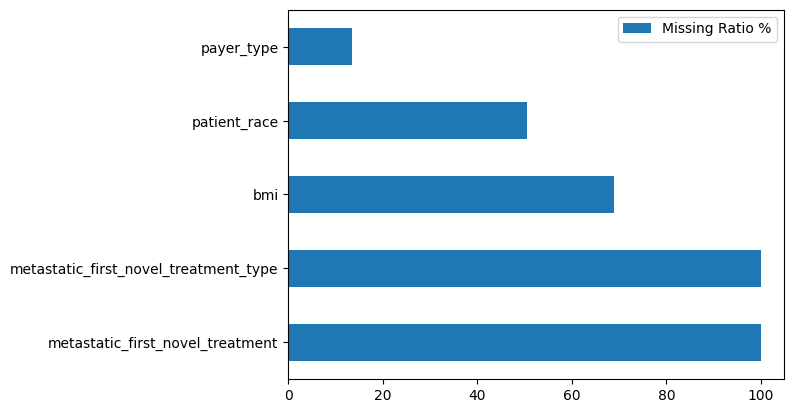

In [9]:
# plot the columns that have the most missing values
def plot_nas(df: pd.DataFrame):
    if df.isnull().sum().sum() != 0:
        na_df = (df.isnull().sum() / len(df)) * 100
        na_df = na_df.drop(na_df[na_df == 0].index).sort_values(ascending=False)
        missing_data = pd.DataFrame({'Missing Ratio %' :na_df})
        missing_data_more_than_20_percent = missing_data[missing_data['Missing Ratio %'] > 10.0]
        missing_data_more_than_20_percent.plot(kind = "barh")
        plt.show()
    else:
        print('No NAs found')

plot_nas(train)

In [10]:
#checking correlation between correlation matrix
corr_matrix = train[num_col].corr()
plt.figure(figsize = (250,155))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

In [11]:
#drop columns with more than 50% of missing data
train.drop(columns=["metastatic_first_novel_treatment"], inplace=True)
train.drop(columns=["bmi"], inplace=True)
train.drop(columns=["metastatic_first_novel_treatment_type"], inplace=True)
train.head(2)

,patient_id,patient_race,payer_type,patient_state,patient_zip3,Region,Division,patient_age,patient_gender,breast_cancer_diagnosis_code,...,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18,metastatic_diagnosis_period
0,268700,NaN,COMMERCIAL,AR,724,South,West South Central,39,F,C50912,...,52.55,74.77,79.96,81.69,78.30,74.56,59.98,42.98,41.18,191
1,484983,White,NaN,IL,629,Midwest,East North Central,55,F,C50412,...,49.30,72.87,77.40,77.43,75.83,72.64,58.36,39.68,39.71,33


In [12]:
#drop columns with more than 50% of missing data
test.drop(columns=["metastatic_first_novel_treatment"], inplace=True)
test.drop(columns=["bmi"], inplace=True)
test.drop(columns=["metastatic_first_novel_treatment_type"], inplace=True)
test.head(2)

,patient_id,patient_race,payer_type,patient_state,patient_zip3,Region,Division,patient_age,patient_gender,breast_cancer_diagnosis_code,...,Average of Mar-18,Average of Apr-18,Average of May-18,Average of Jun-18,Average of Jul-18,Average of Aug-18,Average of Sep-18,Average of Oct-18,Average of Nov-18,Average of Dec-18
0,730681,NaN,COMMERCIAL,LA,713,South,West South Central,55,F,1746,...,62.21,62.23,78.34,81.96,83.58,82.22,80.20,69.73,53.14,51.34
1,334212,Black,NaN,NC,283,South,South Atlantic,60,F,C50912,...,48.63,58.14,77.26,80.05,82.88,82.09,78.85,64.60,50.57,48.10


In [13]:
#check for duplicates
train.duplicated().sum()
#drop duplicates
train.drop_duplicates(inplace=True,keep='first')

In [14]:
#numerical columns
num_col = train.select_dtypes(include=['number']).columns
#categorical columns
cat_col = train.select_dtypes(exclude=['number']).columns

In [15]:
#imputing values for the missing data with % missing values < 50
for col in cat_col:
      mode  =train[col].mode()[0]
      train[col].fillna(mode,inplace=True)
      test[col].fillna(mode,inplace=True)
for col in num_col:
    if col != 'metastatic_diagnosis_period':
        mean=train[col].mean()
        train[col].fillna(mean,inplace=True)
        test[col].fillna(mean,inplace=True)

In [16]:
#checking for missing values
print(train.isnull().sum())
print(test.isnull().sum())

patient_id                          0
patient_race                        0
payer_type                          0
patient_state                       0
patient_zip3                        0
Region                              0
Division                            0
patient_age                         0
patient_gender                      0
breast_cancer_diagnosis_code        0
breast_cancer_diagnosis_desc        0
metastatic_cancer_diagnosis_code    0
population                          0
density                             0
age_median                          0
age_under_10                        0
age_10_to_19                        0
age_20s                             0
age_30s                             0
age_40s                             0
age_50s                             0
age_60s                             0
age_70s                             0
age_over_80                         0
male                                0
female                              0
married     

In [17]:
# describing the train data set
desc = pd.DataFrame(index = list(train))
desc['type'] = train.dtypes
desc['count'] = train.count()
desc['nunique'] = train.nunique()
desc['%unique'] = desc['nunique'] /len(train) * 100
desc['null'] = train.isnull().sum()
desc['%null'] = desc['null'] / len(train) * 100
desc = pd.concat([desc,train.describe().T.drop('count',axis=1)],axis=1)
desc.sort_values(by=['type','null']).style.background_gradient(axis=0)

,type,count,nunique,%unique,null,%null,mean,std,min,25%,50%,75%,max
patient_id,int64,13173,13173,100.000000,0,0.000000,555441.784939,259476.503094,100043.000000,335100.000000,555769.000000,780967.000000,999982.000000
patient_zip3,int64,13173,751,5.701055,0,0.000000,568.530859,275.758485,100.000000,330.000000,557.000000,832.000000,995.000000
patient_age,int64,13173,67,0.508616,0,0.000000,59.271313,13.218883,18.000000,50.000000,59.000000,67.000000,91.000000
metastatic_diagnosis_period,int64,13173,366,2.778410,0,0.000000,96.515221,108.969873,0.000000,3.000000,44.000000,181.000000,365.000000
population,float64,13173,751,5.701055,0,0.000000,20651.373928,13840.379638,635.550000,9160.340000,18952.780000,30021.280000,71374.130000
density,float64,13173,747,5.670690,0,0.000000,1776.872376,3876.061897,0.920000,163.150000,700.340000,1666.520000,29851.690000
age_median,float64,13173,594,4.509223,0,0.000000,40.542676,4.031027,20.600000,37.190000,40.640000,42.940000,54.570000
age_under_10,float64,13173,450,3.416078,0,0.000000,11.104988,1.511534,0.000000,10.150000,11.000000,12.140000,17.680000
age_10_to_19,float64,13173,472,3.583087,0,0.000000,12.857587,1.952248,6.310000,11.650000,12.900000,13.910000,35.300000
age_20s,float64,13173,519,3.939877,0,0.000000,13.297375,3.390472,5.930000,11.000000,12.530000,14.970000,62.100000


In [18]:
from category_encoders import TargetEncoder
#encoding the data
target_encoder = TargetEncoder(cols=train[cat_col])
encoded_data = target_encoder.fit_transform(train[cat_col], train['metastatic_diagnosis_period'])
encoded_data.head(2)


,patient_race,payer_type,patient_state,Region,Division,patient_gender,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code
0,97.27881,96.781444,99.290073,97.181313,94.595461,96.515221,57.040894,57.040894,88.817734
1,97.27881,96.781444,100.509759,96.100903,96.698671,96.515221,60.314223,60.314223,88.817734


In [19]:
#join the encoded data and the numeric data together
train_joined = train[num_col].join(encoded_data)
train_joined.head(2)

,patient_id,patient_zip3,patient_age,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,...,metastatic_diagnosis_period,patient_race,payer_type,patient_state,Region,Division,patient_gender,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code
0,268700,724,39,3924.87,82.63,42.58,11.61,13.03,10.87,11.80,...,191,97.27881,96.781444,99.290073,97.181313,94.595461,96.515221,57.040894,57.040894,88.817734
1,484983,629,55,2745.39,51.79,43.54,11.22,12.19,11.45,11.01,...,33,97.27881,96.781444,100.509759,96.100903,96.698671,96.515221,60.314223,60.314223,88.817734


In [20]:
#separating into X and y variables
y_train = train_joined['metastatic_diagnosis_period']
X_train = train_joined.drop(columns=['metastatic_diagnosis_period'], axis=1)

In [21]:
#feature selection
from sklearn.feature_selection import SelectKBest, f_classif

#select the top 40 features based on anova
selector = SelectKBest(score_func=f_classif, k=40)
X_new = selector.fit_transform(X_train, y_train)

# Get selected feature names
selected_features = np.array(X_train.columns)[selector.get_support()]

print("\nSelected Features:")
print(selected_features)

print("\nTransformed Data with Selected Features:")
X_new = pd.DataFrame(X_new, columns=selected_features).head()


Selected Features:
['Average of Feb-13' 'Average of Mar-13' 'Average of Sep-13'
 'Average of Jan-14' 'Average of Mar-14' 'Average of Apr-14'
 'Average of May-14' 'Average of Jun-14' 'Average of Aug-14'
 'Average of Sep-14' 'Average of Oct-14' 'Average of Jan-15'
 'Average of Feb-15' 'Average of Mar-15' 'Average of Jun-15'
 'Average of Oct-15' 'Average of Jan-16' 'Average of Feb-16'
 'Average of Apr-16' 'Average of Jun-16' 'Average of Aug-16'
 'Average of Sep-16' 'Average of Nov-16' 'Average of Feb-17'
 'Average of Mar-17' 'Average of May-17' 'Average of Jun-17'
 'Average of Nov-17' 'Average of Dec-17' 'Average of Jan-18'
 'Average of Mar-18' 'Average of May-18' 'Average of Jun-18'
 'Average of Sep-18' 'Average of Nov-18' 'patient_state' 'patient_gender'
 'breast_cancer_diagnosis_code' 'breast_cancer_diagnosis_desc'
 'metastatic_cancer_diagnosis_code']

Transformed Data with Selected Features:


In [22]:
#checking the head of the new X variable
X_new.head(2)

,Average of Feb-13,Average of Mar-13,Average of Sep-13,Average of Jan-14,Average of Mar-14,Average of Apr-14,Average of May-14,Average of Jun-14,Average of Aug-14,Average of Sep-14,...,Average of Mar-18,Average of May-18,Average of Jun-18,Average of Sep-18,Average of Nov-18,patient_state,patient_gender,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code
0,39.88,42.75,73.67,31.67,42.35,57.72,67.35,75.92,79.59,70.84,...,50.22,74.77,79.96,74.56,42.98,99.290073,96.515221,57.040894,57.040894,88.817734
1,36.15,39.41,70.44,26.88,40.32,56.85,66.84,75.12,77.08,67.15,...,44.18,72.87,77.40,72.64,39.68,100.509759,96.515221,60.314223,60.314223,88.817734


In [23]:
#scaling the data
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
scaled_X = scaler.fit_transform(X_new)
scaled_X

array([[-8.05844156e-01, -8.59193816e-01,  2.87925697e-01,
        -9.15541710e-01, -7.92836399e-01, -2.72180451e-01,
         0.00000000e+00,  1.07238606e-01,  4.22558923e-01,
         0.00000000e+00, -4.96822034e-01, -8.64384749e-01,
        -8.13617822e-01, -8.24513795e-01,  2.83935243e-01,
        -5.69816643e-01, -9.79233227e-01, -8.76878333e-01,
        -2.61213720e-01,  4.00172861e-01,  1.56992084e-01,
         8.38805970e-01, -5.64966314e-01, -5.85118377e-01,
        -6.12456747e-01,  3.80062305e-01,  1.93265007e-01,
        -6.18033813e-01, -7.39733060e-01, -9.07789032e-01,
        -6.08981380e-01,  4.56499488e-01,  2.29390681e-01,
         5.54913295e-01, -9.00964957e-01,  1.00000000e+00,
         0.00000000e+00, -1.97215180e-02, -1.97215180e-02,
         0.00000000e+00],
       [-1.04805195e+00, -1.04362231e+00, -7.12074303e-01,
        -1.08134303e+00, -8.91093901e-01, -4.03007519e-01,
        -1.76470588e-01,  0.00000000e+00,  0.00000000e+00,
        -4.25605536e-01, -9.25